In [17]:
import sys
from pathlib import Path

p = Path.cwd()
while p != p.parent and not (p / "src").exists():
    p = p.parent

REPO = p
SRC = REPO / "src"
sys.path.insert(0, str(SRC))

print("Using REPO:", REPO)
print("SRC exists:", SRC.exists(), SRC)

%load_ext autoreload
%autoreload 2


Using REPO: /Users/oliwiaw/PycharmProjects/WMUM
SRC exists: True /Users/oliwiaw/PycharmProjects/WMUM/src
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [18]:
from pathlib import Path
import eval_models

print("ROOT:", eval_models.ROOT)
print("RUNS:", eval_models.RUNS)
print("OUT:", eval_models.OUT)
print("DATA_YOLO:", eval_models.DATA_YOLO)
print("DATA_COCO:", eval_models.DATA_COCO)

#debug: sprawdź czy out istnieje
eval_models.ensure_dir(Path(eval_models.OUT))


ROOT: /Users/oliwiaw/PycharmProjects/WMUM
RUNS: /Users/oliwiaw/PycharmProjects/WMUM/runs
OUT: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis
DATA_YOLO: /Users/oliwiaw/PycharmProjects/WMUM/data/processed/yolov8
DATA_COCO: /Users/oliwiaw/PycharmProjects/WMUM/data/processed/coco


In [19]:
from dataclasses import asdict
import pandas as pd

datasets = ["cats_dogs", "traffic_signs", "vehicles"]
rows = []

for ds in datasets:
    # wspólne obrazki z YOLO valid/images
    shared_dir = eval_models.yolo_valid_images_dir(ds)
    shared_imgs = eval_models.pick_images(shared_dir, k=12, seed=0)

    print(ds, "shared_dir =", shared_dir)
    print("n shared:", len(shared_imgs))

    # różne kolory dla yolo 8n i 8s
    r = eval_models.eval_yolo(ds, "yolov8n", conf=0.5, seed=0, color="red", topk=10, image_paths=shared_imgs)
    rows.append(asdict(r))
    print("OK", r)

    r = eval_models.eval_yolo(ds, "yolov8s", conf=0.5, seed=0, color="orange", topk=10, image_paths=shared_imgs)
    rows.append(asdict(r))
    print("OK", r)

     # robimy i RGB i GRAY (jeśli istnieją wagi; jak nie, to skip)
    # Torchvision na tych samych plikach co YOLO (RGB + GRAY)

    r = eval_models.eval_torchvision_on_images(
        ds, "fasterrcnn", shared_imgs,
        score_thr=0.3, device="cpu", color="blue", topk=10,
        mode="rgb",
    )
    rows.append(asdict(r))
    print("OK", r)

    r = eval_models.eval_torchvision_on_images(
        ds, "retinanet", shared_imgs,
        score_thr=0.3, device="cpu", color="green", topk=10,
        mode="rgb",
    )
    rows.append(asdict(r))
    print("OK", r)

    r = eval_models.eval_torchvision_on_images(
        ds, "fasterrcnn", shared_imgs,
        score_thr=0.3, device="cpu", color="blue", topk=10,
        mode="gray",
    )
    rows.append(asdict(r))
    print("OK", r)

    r = eval_models.eval_torchvision_on_images(
        ds, "retinanet", shared_imgs,
        score_thr=0.3, device="cpu", color="green", topk=10,
        mode="gray",
    )
    rows.append(asdict(r))
    print("OK", r)


df = pd.DataFrame(rows)
df


cats_dogs shared_dir = /Users/oliwiaw/PycharmProjects/WMUM/data/processed/yolov8/cats_dogs/valid/images
n shared: 12
OK EvalRow(framework='ultralytics', dataset='cats_dogs', model='yolov8n', input_mode='n/a', n_images=12, score_thr=0.5, topk=10, avg_dets_per_img=0.75, avg_score=0.9130007161034478, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8n')
OK EvalRow(framework='ultralytics', dataset='cats_dogs', model='yolov8s', input_mode='n/a', n_images=12, score_thr=0.5, topk=10, avg_dets_per_img=0.8333333333333334, avg_score=0.8120570719242096, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8s')
OK EvalRow(framework='torchvision', dataset='cats_dogs', model='fasterrcnn', input_mode='rgb', n_images=12, score_thr=0.3, topk=10, avg_dets_per_img=2.75, avg_score=0.5161629987485481, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/cats_dogs__fasterrcnn__rgb')
OK EvalRow(framework='torchvision', 

,framework,dataset,model,input_mode,n_images,score_thr,topk,avg_dets_per_img,avg_score,out_dir
0,ultralytics,cats_dogs,yolov8n,n/a,12,0.5,10,0.750000,0.913001,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
1,ultralytics,cats_dogs,yolov8s,n/a,12,0.5,10,0.833333,0.812057,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
2,torchvision,cats_dogs,fasterrcnn,rgb,12,0.3,10,2.750000,0.516163,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
3,torchvision,cats_dogs,retinanet,rgb,12,0.3,10,1.333333,0.471336,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
4,torchvision,cats_dogs,fasterrcnn,gray,12,0.3,10,2.583333,0.482958,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
5,torchvision,cats_dogs,retinanet,gray,12,0.3,10,0.583333,0.549009,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
6,ultralytics,traffic_signs,yolov8n,n/a,12,0.5,10,0.666667,0.828216,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
7,ultralytics,traffic_signs,yolov8s,n/a,12,0.5,10,0.333333,0.713634,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
8,torchvision,traffic_signs,fasterrcnn,rgb,12,0.3,10,0.500000,0.524571,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
9,torchvision,traffic_signs,retinanet,rgb,12,0.3,10,0.000000,0.000000,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...


In [20]:
eval_models.write_csv(rows, Path(eval_models.OUT) / "quick_eval_all.csv")
print("Saved:", Path(eval_models.OUT) / "quick_eval_all.csv")

Saved: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/quick_eval_all.csv


In [21]:
from pathlib import Path
import eval_models

base = Path(eval_models.OUT)

#debug
checks = [
    ("YOLOv8n", base / "ultralytics" / "cats_dogs__yolov8n"),
    ("YOLOv8s", base / "ultralytics" / "traffic_signs__yolov8s"),
    ("FasterRCNN", base / "torchvision" / "vehicles__fasterrcnn"),
    ("FasterRCNN B&W", base / "torchvision" / "vehicles__fasterrcnn__gray"),
    ("RetinaNet", base / "torchvision" / "cats_dogs__retinanet"),
    ("RetinaNet B&W", base / "torchvision" / "cats_dogs__retinanet__gray"),
]

for name, d in checks:
    n = len(list(d.glob("*__pred.jpg"))) if d.exists() else 0
    print(f"{name:10s} exists={d.exists()}  n_pred={n}  dir={d}")


YOLOv8n    exists=True  n_pred=12  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8n
YOLOv8s    exists=True  n_pred=12  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/traffic_signs__yolov8s
FasterRCNN exists=True  n_pred=24  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/vehicles__fasterrcnn
FasterRCNN B&W exists=True  n_pred=12  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/vehicles__fasterrcnn__gray
RetinaNet  exists=True  n_pred=24  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/cats_dogs__retinanet
RetinaNet B&W exists=True  n_pred=12  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/cats_dogs__retinanet__gray


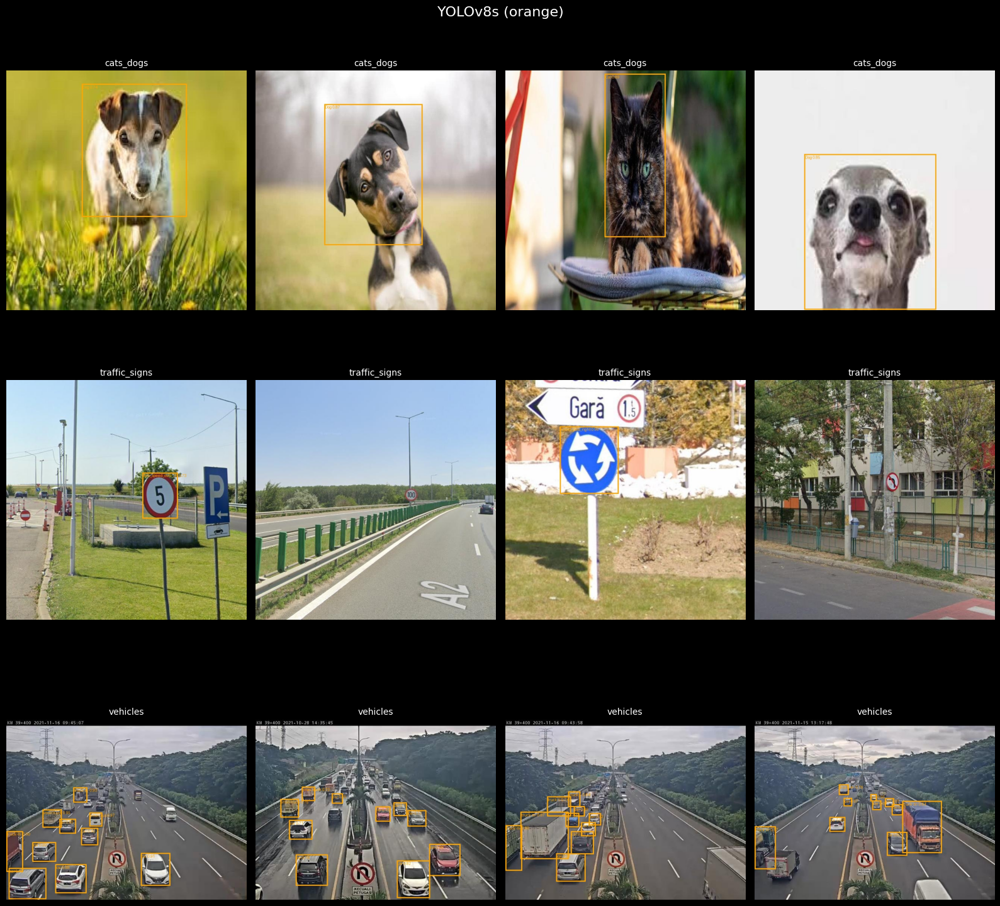

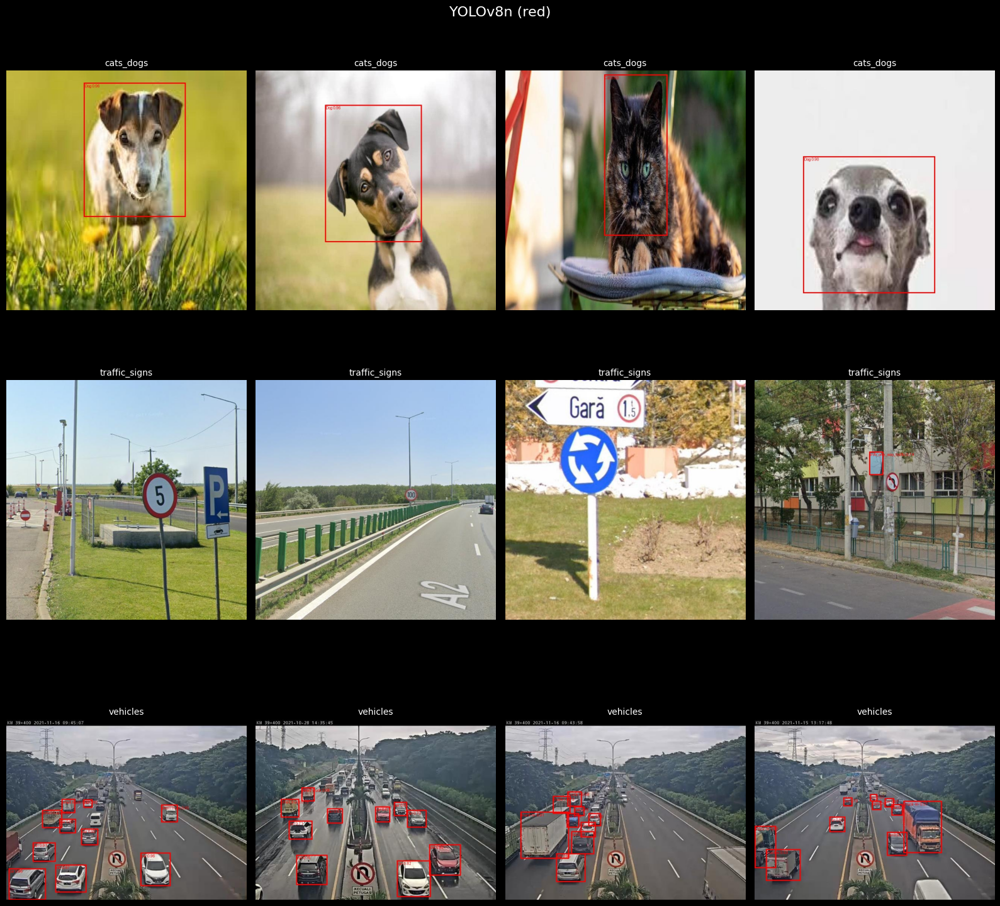

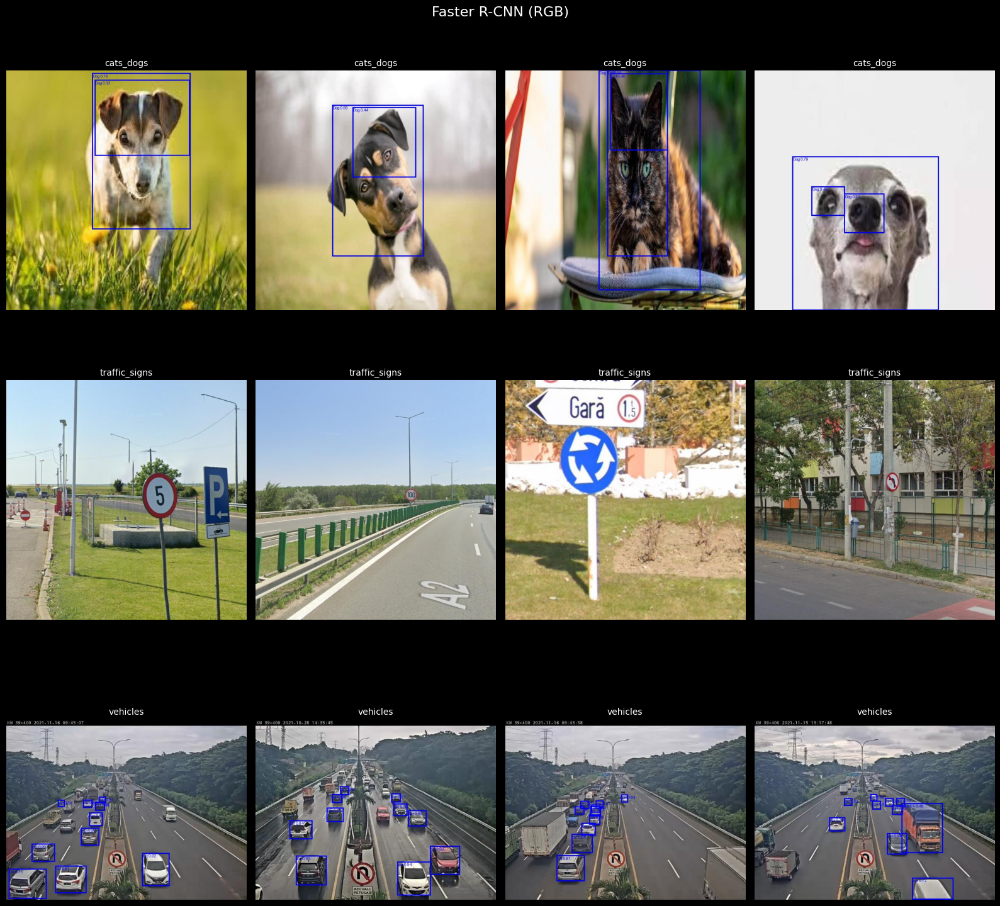

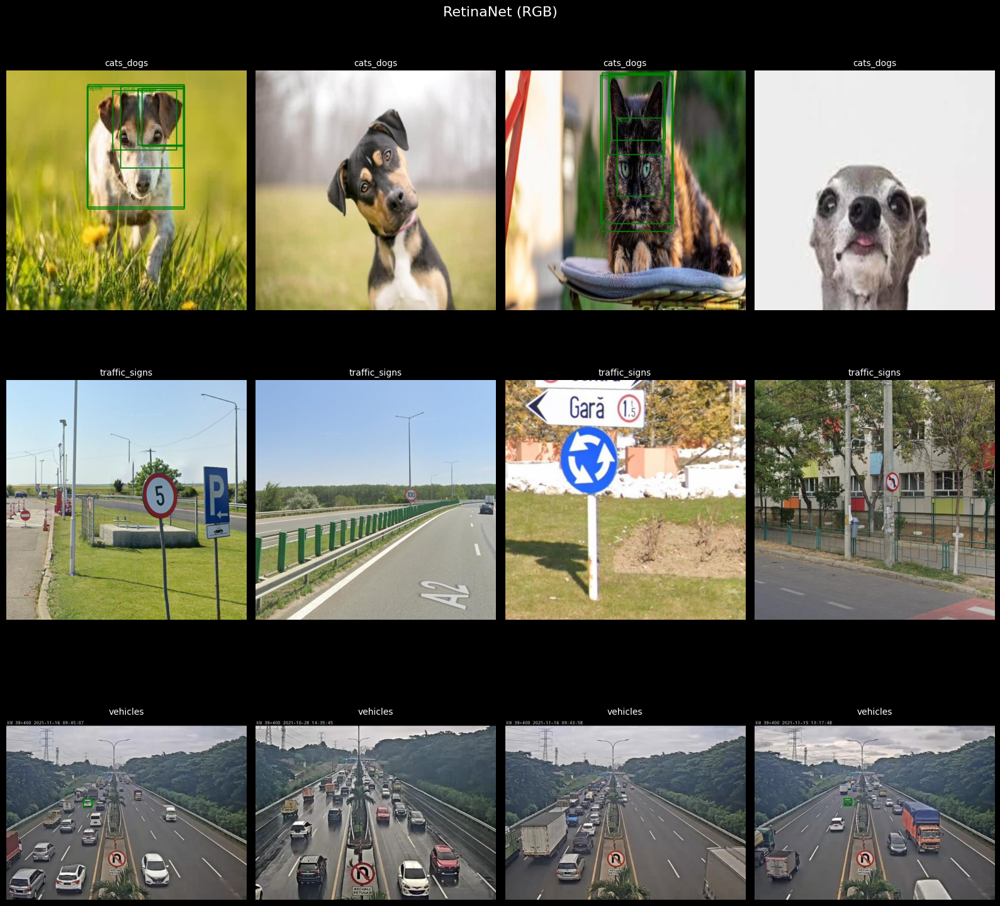

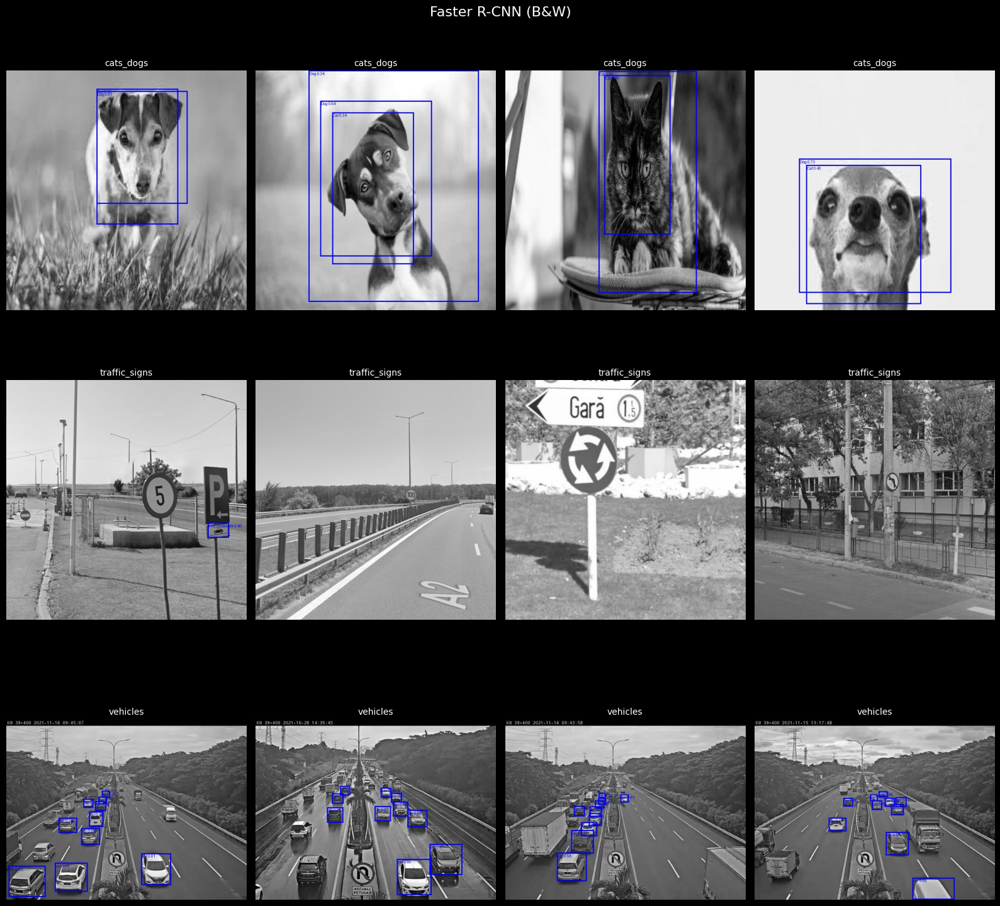

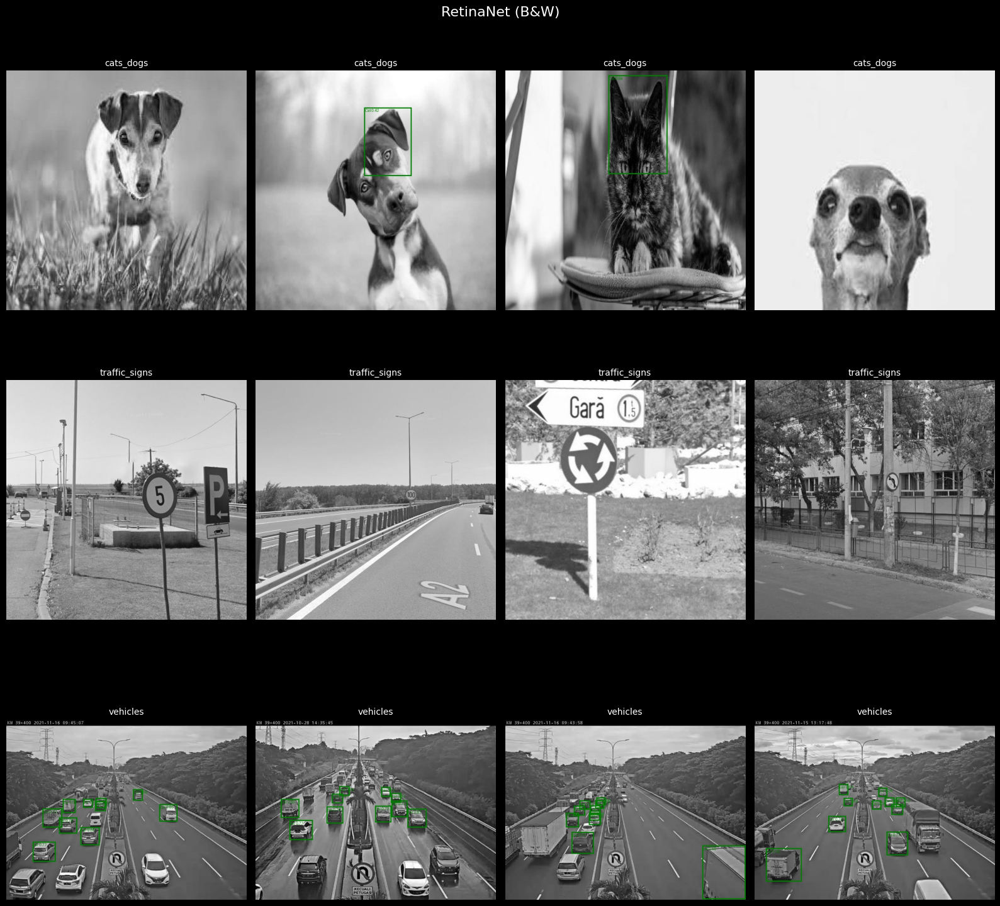

In [23]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import eval_models as evalmodels

base = Path(evalmodels.OUT)

plan = [("cats_dogs", 4), ("traffic_signs", 4), ("vehicles", 4)]


def pick_stems(ds: str, k: int = 4, seed: int = 0):
    img_dir = evalmodels.yolo_valid_images_dir(ds)
    imgs = evalmodels.pick_images(img_dir, k=k, seed=seed)
    return [p.stem for p in imgs]


items = []
for ds, k in plan:
    stems = pick_stems(ds, k=k, seed=0)
    items.extend([(ds, s) for s in stems])

# Ujednolicamy: zawsze 4 pola (title, root, model, mode)
# mode=None => YOLO (folder: {ds}__{model})
# mode="rgb"/"gray" => Torchvision (folder: {ds}__{model}__{mode})
models = [
    ("YOLOv8s (orange)", base / "ultralytics", "yolov8s", None),
    ("YOLOv8n (red)", base / "ultralytics", "yolov8n", None),

    ("Faster R-CNN (RGB)", base / "torchvision", "fasterrcnn", "rgb"),
    ("RetinaNet (RGB)", base / "torchvision", "retinanet", "rgb"),

    ("Faster R-CNN (B&W)", base / "torchvision", "fasterrcnn", "gray"),
    ("RetinaNet (B&W)", base / "torchvision", "retinanet", "gray"),
]


def show_grid(title, root, model, mode=None, nrows=3, ncols=4):
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 16))
    fig.suptitle(title, fontsize=16)
    axes = axes.flatten()

    for i, (ds, stem) in enumerate(items):
        ax = axes[i]

        if mode is None:
            p = root / f"{ds}__{model}" / f"{stem}__pred.jpg"
        else:
            p = root / f"{ds}__{model}__{mode}" / f"{stem}__pred.jpg"

        if not p.exists():
            ax.set_title(f"{ds}\nMISSING", fontsize=9)
            ax.axis("off")
            continue

        img = Image.open(p).convert("RGB")
        ax.imshow(np.array(img))
        ax.set_title(ds, fontsize=10)
        ax.axis("off")

    for j in range(len(items), nrows * ncols):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()


for title, root, model, mode in models:
    show_grid(title, root, model, mode=mode)

